In [1]:
import pandas as pd
# import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import make_scorer, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import lightgbm as lgb
import shap
import lime
import os
# from joblib import dump
import joblib
import warnings
import statsmodels.api as sm
import numpy as np

warnings.filterwarnings('ignore')
# import dask.dataframe as dd


In [2]:
exps_dir = "../../exps"
if os.path.exists(exps_dir) == False: # tạo thư mục (nếu chưa có)
  os.makedirs(exps_dir, exist_ok=True)

save_dir = f"{exps_dir}/exp2"
os.makedirs(save_dir, exist_ok=True)

In [3]:
style_dir='../../styles'
plt.style.use(f'{style_dir}/style.mplstyle')
shap.initjs()

In [4]:
X_train=pd.read_csv(f'{save_dir}/X_train.csv', index_col=None)
X_valid=pd.read_csv(f'{save_dir}/X_valid.csv', index_col=None)
y_train=pd.read_csv(f'{save_dir}/y_train.csv', index_col=None)
y_valid=pd.read_csv(f'{save_dir}/y_valid.csv', index_col=None)
X_test = pd.read_csv(f'{save_dir}/X_test.csv', index_col=None)
y_test = pd.read_csv(f'{save_dir}/y_test.csv', index_col=None)

In [5]:
X_train.drop(columns=['Unnamed: 0'], inplace=True)
X_valid.drop(columns=['Unnamed: 0'], inplace=True)
y_train.drop(columns=['Unnamed: 0'], inplace=True)
y_valid.drop(columns=['Unnamed: 0'], inplace=True)
X_test.drop(columns=['Unnamed: 0'], inplace=True)
y_test.drop(columns=['Unnamed: 0'], inplace=True)

In [7]:
X = pd.read_csv(f'{save_dir}/X.csv', index_col=None)
y = pd.read_csv(f'{save_dir}/y.csv', index_col=None)
X.shape, y.shape

((1611126, 142), (1611126, 2))

In [8]:
y.drop(columns=['Unnamed: 0'], inplace=True)
X.drop(columns=['Unnamed: 0'], inplace=True)


In [9]:
print("X_train shape:", X_train.shape)
print("X_valid shape:", X_valid.shape)
print("y_train shape:", y_train.shape)
print("y_valid shape:", y_valid.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1079454, 141)
X_valid shape: (531672, 141)
y_train shape: (1079454, 1)
y_valid shape: (531672, 1)
X_test shape: (6144, 141)
y_test shape: (6144, 1)


### Analyze the regression relation

#### Use OLS regression

In [10]:
def analyze_OLS(x,y):
    x = sm.add_constant(x)  
    model = sm.OLS(y, x,hasconst=True)
    results = model.fit()
    summary = results.summary()
    # print(summary)
    return summary
print(analyze_OLS(X,y))

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                 2.244e+05
Date:                Thu, 25 Jul 2024   Prob (F-statistic):               0.00
Time:                        15:20:17   Log-Likelihood:            -1.0884e+07
No. Observations:             1611126   AIC:                         2.177e+07
Df Residuals:                 1610986   BIC:                         2.177e+07
Df Model:                         139                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

#### Use Linear machine learning model

In [11]:
def print_sorted_coefficients(model, model_name, feature_names):
    coef = model.coef_
    if len(coef.shape) > 1:
        coef = coef[0]
    sorted_indices = np.argsort(-np.abs(coef))  
    sorted_coef = coef[sorted_indices]
    sorted_feature_names = [feature_names[i] for i in sorted_indices]
    for i, (name, value) in enumerate(zip(sorted_feature_names, sorted_coef)):
        print(f"{model_name} Coefficient {i + 1}: {name}, Coefficient: {value}")

In [12]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_pred_linear = linear_model.predict(X_valid)

print_sorted_coefficients(linear_model, "Linear Regression", X_train.columns)
print("Linear Regression intercept:", linear_model.intercept_)

Linear Regression Coefficient 1: diffuse_radiation_hl_2d, Coefficient: 145460.57463435706
Linear Regression Coefficient 2: shortwave_radiation_hl_2d, Coefficient: -145460.53389394458
Linear Regression Coefficient 3: direct_solar_radiation_hl_2d, Coefficient: 145460.52706111418
Linear Regression Coefficient 4: direct_solar_radiation_hl_7d, Coefficient: -51489.94999321469
Linear Regression Coefficient 5: shortwave_radiation_hl_7d, Coefficient: 51489.88815896116
Linear Regression Coefficient 6: diffuse_radiation_hl_7d, Coefficient: -51489.88578237328
Linear Regression Coefficient 7: total_precipitation_fd_7d, Coefficient: -21704.863329718923
Linear Regression Coefficient 8: target_mean, Coefficient: -19402.973221916443
Linear Regression Coefficient 9: snowfall, Coefficient: 11295.778193110602
Linear Regression Coefficient 10: diffuse_radiation, Coefficient: -11013.073754023178
Linear Regression Coefficient 11: direct_solar_radiation_hd_2d, Coefficient: -11012.918114418895
Linear Regressio

In [13]:
print("Linear Regression R²:", r2_score(y_valid, y_pred_linear))
print("Linear Regression MAE:", mean_absolute_error(y_valid, y_pred_linear))

Linear Regression R²: 0.9375564639846742
Linear Regression MAE: 129.66385950381286


In [14]:
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
y_pred_ridge = ridge_model.predict(X_valid)

In [15]:

print_sorted_coefficients(ridge_model, "Ridge Regression", X_train.columns)
print("Ridge Regression intercept:", ridge_model.intercept_)


Ridge Regression Coefficient 1: total_precipitation_fl_7d, Coefficient: -161.40391749379123
Ridge Regression Coefficient 2: total_precipitation_fd_7d, Coefficient: -118.16362762454912
Ridge Regression Coefficient 3: total_precipitation_fl, Coefficient: 92.56033891444937
Ridge Regression Coefficient 4: snowfall_fl, Coefficient: 63.29416874500787
Ridge Regression Coefficient 5: target_mean, Coefficient: -40.916991325710875
Ridge Regression Coefficient 6: snowfall, Coefficient: 38.35162876112423
Ridge Regression Coefficient 7: snowfall_hd_2d, Coefficient: 30.68943160218915
Ridge Regression Coefficient 8: rain_hd_7d, Coefficient: -26.003471040656816
Ridge Regression Coefficient 9: sin(dayofyear), Coefficient: -20.33919662191678
Ridge Regression Coefficient 10: rain, Coefficient: -16.247361446592485
Ridge Regression Coefficient 11: snowfall_hd_7d, Coefficient: 9.514116080440015
Ridge Regression Coefficient 12: snowfall_fd_7d, Coefficient: -7.91008046639306
Ridge Regression Coefficient 13: s

### Build LGBM and Improve in valid set

In [18]:

# lgbm_model = lgb.LGBMRegressor(objective='regression',**best_params['lgb_grid_search'].item())
# lgbm_model.fit(X_train, y_train)
# dump(lgbm_model, f'{save_dir}/lgbm_model_tuning.joblib')
# Train LightGBM model
lgbm_model = joblib.load(f'{save_dir}/lgbm_model_tuning.joblib')

In [19]:
lgbm_model_predictions = lgbm_model.predict(X_valid)
lgbm_model_mae = mean_absolute_error(y_valid, lgbm_model_predictions)
lgbm_model_r2 = r2_score(y_valid, lgbm_model_predictions)
print(f"LGBM model - Validation MAE: {lgbm_model_mae:.3f}, Validation R2: {lgbm_model_r2:.3f}")

LGBM model - Validation MAE: 58.483, Validation R2: 0.958


### Use LIME, SHAP to explained

100%|===================| 531553/531672 [41:19<00:00]        

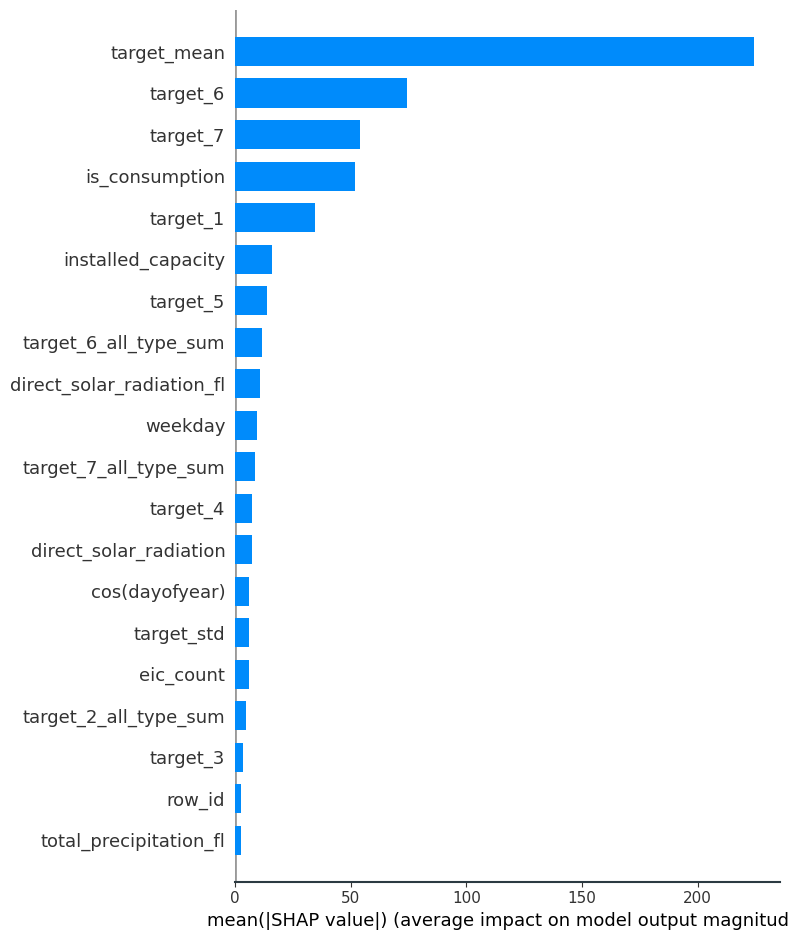

In [20]:
explainer_lgbm = shap.Explainer(lgbm_model, X_train)
shap_values_lgbm = explainer_lgbm(X_valid, check_additivity=False)


shap.summary_plot(shap_values_lgbm, X_valid, plot_type="bar", title="SHAP LGBM Feature Importance")


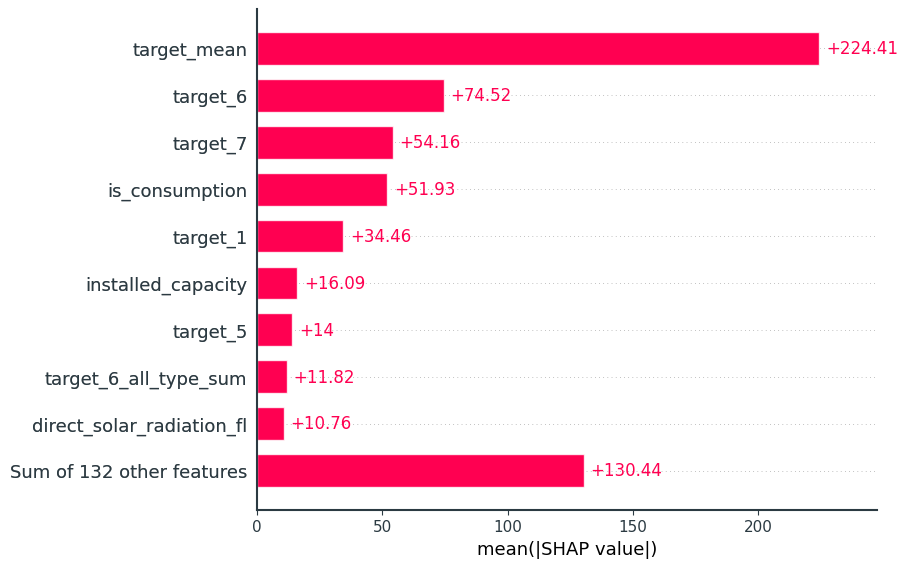

In [55]:
shap.plots.bar(shap_values_lgbm, show=False)
plt.show()


In [56]:
i_med = np.argsort(lgbm_model_predictions)[len(lgbm_model_predictions)//2]
i_max = np.argmax(lgbm_model_predictions)
i_80 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.8)]
i_60 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.6)]
i_40 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.4)]
i_20 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.2)]
i_min = np.argmin(lgbm_model_predictions)


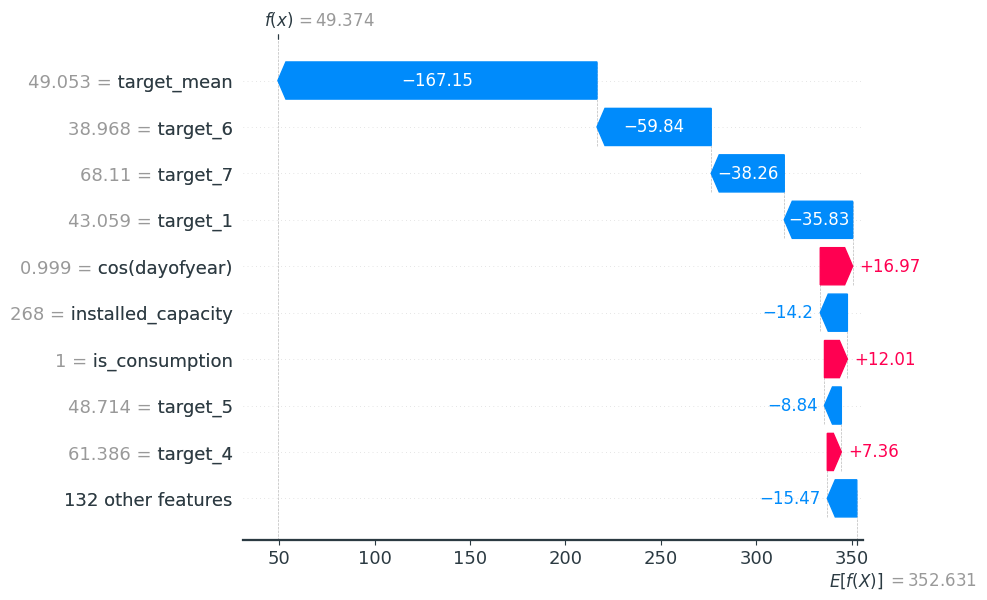

In [57]:
shap.plots.waterfall(shap_values_lgbm[i_med],show=True)
plt.show()
# plt.savefig("plots/waterfall_median.png")

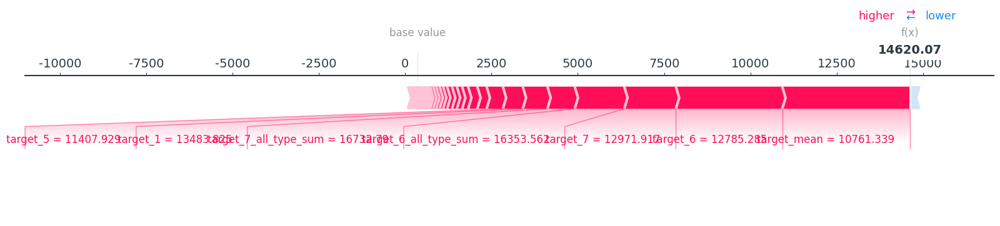

In [58]:
shap.plots.force(shap_values_lgbm[i_max], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_max.png")

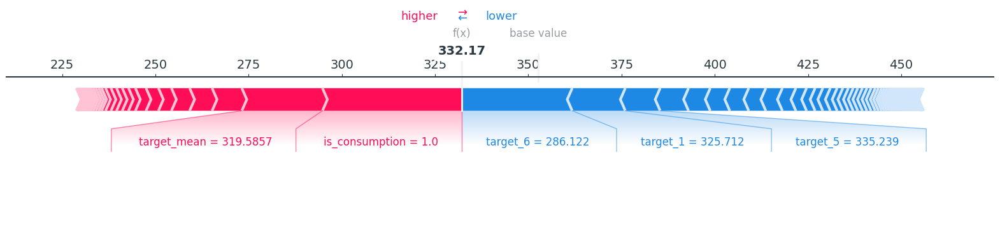

In [59]:
shap.plots.force(shap_values_lgbm[i_80], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_80.png")

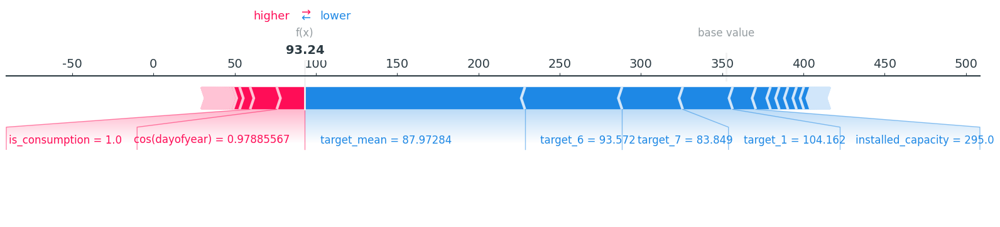

In [60]:
shap.plots.force(shap_values_lgbm[i_60], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_60.png")

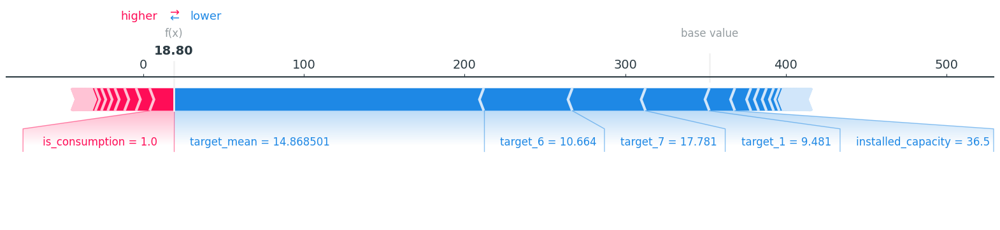

In [61]:
shap.plots.force(shap_values_lgbm[i_40], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_40.png")

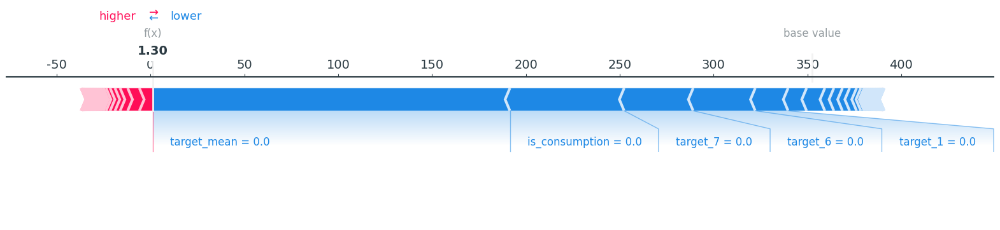

In [62]:
shap.plots.force(shap_values_lgbm[i_20], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_20.png")

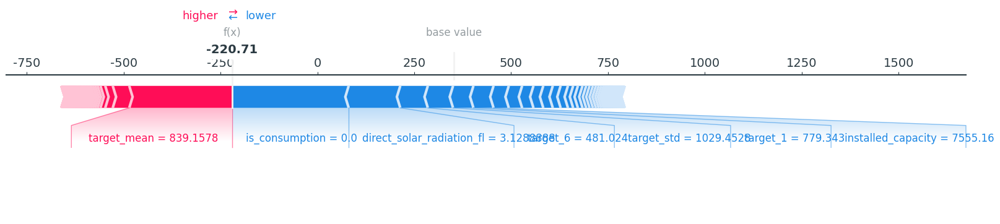

In [63]:
shap.plots.force(shap_values_lgbm[i_min], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_min.png")

In [64]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    mode='regression',
    feature_names=X_train.columns,
    class_names=['target'],
    verbose=True,
    discretize_continuous=True
)


In [65]:
j = i_min
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 96.3037924548284
Prediction_local [519.77461368]
Right: -220.7063705081571


In [66]:
exp.show_in_notebook(show_table=True)


In [67]:
exp.as_list()


[('target_mean > 180.78', 807.7021836963626),
 ('year > 2022.00', -740.480984183806),
 ('target_7 > 167.03', 173.66573975253718),
 ('target_6 > 168.34', 167.1384720144883),
 ('target_1 > 169.34', 135.2620651605482),
 ('is_consumption <= 0.00', -120.73565434562606),
 ('26.69 < cloudcover_mid_hd_7d <= 52.52', 38.18178771083863),
 ('target_std > 45.16', -37.230562200482915),
 ('target_4 > 168.80', -36.1483663451433),
 ('installed_capacity > 1537.70', 36.11613996111163)]

In [68]:
j = i_20
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 528.7926531527238
Prediction_local [2.31553083]
Right: 1.3034016255728598


In [69]:
exp.show_in_notebook(show_table=True)


In [70]:
exp.as_list()


[('target_mean <= 1.24', -302.96925720856206),
 ('is_consumption <= 0.00', -139.57455721438842),
 ('target_6 <= 0.77', -64.4744365482179),
 ('target_1 <= 0.77', -59.272540672244496),
 ('325.00 < installed_capacity <= 637.55', 51.766693220461875),
 ('target_7 <= 0.76', -51.36362119356005),
 ('direct_solar_radiation_fl <= 0.00', -43.2153918584479),
 ('windspeed_10m_hl_2d <= 2.64', 42.89305538648406),
 ('141.67 < winddirection_10m_hl_7d <= 201.00', 40.74506297209955),
 ('year > 2022.00', -1.0121292053878728)]

In [71]:
j = i_40
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 374.0501194719361
Prediction_local [73.47083618]
Right: 18.800123463101045


In [72]:
exp.show_in_notebook(show_table=True)


In [73]:
exp.as_list()


[('1.24 < target_mean <= 37.05', -294.5620023522077),
 ('0.50 < is_consumption <= 1.00', 127.87881212099609),
 ('0.76 < target_7 <= 32.64', -64.39092480119021),
 ('-0.71 < cos(hour) <= -0.00', 60.89641393480289),
 ('installed_capacity <= 325.00', -58.67202538488917),
 ('year > 2022.00', -54.67071271565608),
 ('0.77 < target_6 <= 32.76', -53.97529892423413),
 ('cos(dayofyear) > 0.60', 47.58006085248524),
 ('0.77 < target_1 <= 32.80', -47.355730614879114),
 ('snowfall_hl_7d <= 0.00', 36.69212459159149)]

In [74]:
j = i_med
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 407.0118746906699
Prediction_local [238.46590163]
Right: 49.37425436567923


In [75]:
exp.show_in_notebook(show_table=True)


In [76]:
exp.as_list()


[('37.05 < target_mean <= 180.78', -205.59165706202947),
 ('0.50 < is_consumption <= 1.00', 127.83946666714274),
 ('32.80 < target_1 <= 169.34', -49.20041929408595),
 ('month > 9.00', -48.58859038891141),
 ('direct_solar_radiation_fl <= 0.00', -42.09941469417782),
 ('0.00 < total_precipitation_fl <= 0.00', 41.6430208556539),
 ('-2.37 < dewpoint_fl_7d <= 3.93', 38.713308835363016),
 ('windspeed_10m_hd_7d > 5.72', 37.69935125577984),
 ('3.25 < windspeed_10m <= 4.37', -35.34060993891508),
 ('snowfall_hl_2d <= 0.00', -33.62042929614742)]

In [77]:
j = i_60
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 415.1524035382916
Prediction_local [14.32854717]
Right: 93.24358133418677


In [78]:
exp.show_in_notebook(show_table=True)


In [79]:
exp.as_list()


[('37.05 < target_mean <= 180.78', -210.23439091934358),
 ('0.50 < is_consumption <= 1.00', 124.71940450069658),
 ('32.64 < target_7 <= 167.03', -83.57019609915935),
 ('32.76 < target_6 <= 168.34', -71.34781783767022),
 ('7.67 < diffuse_radiation_hl_2d <= 89.50', -52.149085956166374),
 ('cos(dayofyear) > 0.60', 45.29978685773205),
 ('32.80 < target_1 <= 169.34', -44.18856938093499),
 ('installed_capacity <= 325.00', -39.30364753783105),
 ('snowfall_hl_2d > 0.00', -35.52547390741611),
 ('cloudcover_low_fl > 0.89', -34.523866086335936)]

In [80]:
j = i_80
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept -24.484453171101222
Prediction_local [882.46316733]
Right: 332.1700503978493


In [81]:
exp.show_in_notebook(show_table=True)


In [82]:
exp.as_list()


[('target_mean > 180.78', 804.2962631004298),
 ('year > 2022.00', -550.2931169287467),
 ('target_6 > 168.34', 203.42268541819232),
 ('target_7 > 167.03', 171.3400012239778),
 ('target_1 > 169.34', 144.82788025178414),
 ('0.50 < is_consumption <= 1.00', 130.36631452200766),
 ('installed_capacity > 1537.70', 41.83467550484581),
 ('direct_solar_radiation_fl <= 0.00', -36.70169350696374),
 ('direct_solar_radiation <= 0.00', -24.85767953849315),
 ('target_5 > 168.57', 22.712290450659307)]

In [83]:
j = i_max
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept -72.06777640880466
Prediction_local [8082.18632259]
Right: 14620.074537286595


In [84]:
exp.show_in_notebook(show_table=True)


In [85]:
exp.as_list()


[('year > 2022.00', 6537.8882146932165),
 ('target_mean > 180.78', 810.7019808722374),
 ('target_6 > 168.34', 211.90185627750932),
 ('target_7 > 167.03', 193.16585794455733),
 ('target_1 > 169.34', 164.4794508158229),
 ('0.50 < is_consumption <= 1.00', 125.70136920121399),
 ('dewpoint_fl <= -2.37', 46.40091833597999),
 ('cos(dayofyear) > 0.60', 42.633441950516264),
 ('eic_count > 67.00', 39.22096387226904),
 ('target_std > 45.16', -17.839954961155367)]

### Build Decision Tree and Improve in valid set

In [89]:
!python -m pip install scikit-learn==1.3.0

  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.2
    Uninstalling scikit-learn-1.4.2:
      Successfully uninstalled scikit-learn-1.4.2


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\lenovo\\AppData\\Local\\Programs\\Python\\Python310\\Lib\\site-packages\\~klearn\\.libs\\msvcp140.dll'
Consider using the `--user` option or check the permissions.

You should consider upgrading via the 'c:\Users\lenovo\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [95]:
import sklearn
print(sklearn.__version__)

1.4.2


In [90]:
# dt_model = DecisionTreeRegressor(random_state=42, **best_params['dt_grid_search'].item())
# dt_model.fit(X_train, y_train)
# dump(dt_model, f'{save_dir}/dt_model_tuning.joblib')
dt_model=joblib.load(f'{save_dir}/dt_model_tuning.joblib')

In [91]:
dt_model

AttributeError: 'DecisionTreeRegressor' object has no attribute 'monotonic_cst'

AttributeError: 'DecisionTreeRegressor' object has no attribute 'monotonic_cst'

AttributeError: 'DecisionTreeRegressor' object has no attribute 'monotonic_cst'

In [92]:
dt_valid_predictions = dt_model.predict(X_valid)
# y_pred = scaler_y.inverse_transform(dt_valid_predictions.reshape(-1, 1))
dt_valid_mae = mean_absolute_error(y_valid, dt_valid_predictions)
dt_valid_r2 = r2_score(y_valid, dt_valid_predictions)
print(f"Decision Tree - Validation MAE: {dt_valid_mae:.3f}, Validation R2: {dt_valid_r2:.3f}")


AttributeError: 'DecisionTreeRegressor' object has no attribute 'monotonic_cst'

In [93]:
importances = dt_model.feature_importances_
indices = np.argsort(importances)[::-1]

In [ ]:
print("Feature ranking:")
for i, index in enumerate(indices):
    print(f"{i + 1}. feature {X_train.columns[index]} ({importances[index]})")

Feature ranking:


NameError: name 'indices' is not defined

### Use LIME, SHAP to explained

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    mode='regression',  # Hoặc 'classification' nếu bạn làm việc với bài toán phân loại
    feature_names=X_train.columns,
    class_names=['target'],
    verbose=True,
    discretize_continuous=True
)


In [ ]:
dt_valid_predictions = 

In [ ]:
i_med = np.argsort(dt_valid_predictions)[len(dt_valid_predictions)//2]
i_max = np.argmax(dt_valid_predictions)
i_80 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.8)]
i_60 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.6)]
i_40 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.4)]
i_20 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.2)]
i_min = np.argmin(dt_valid_predictions)

NameError: name 'dt_valid_predictions' is not defined

In [ ]:
j = i_min
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=10)

Intercept 0.4043172433507004
Prediction_local [-0.31957221]
Right: -0.3011037138730723


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.35737090928294785),
 ('is_consumption <= 0.00', -0.22566234696645315),
 ('16.00 < prediction_unit_id <= 33.00', -0.08053416469693474),
 ('-0.47 < installed_capacity <= -0.33', -0.07052924475087857),
 ('-0.81 < temperature_fl <= -0.00', -0.06273865173973173),
 ('-0.68 < direct_solar_radiation <= 0.64', 0.06187196252797106),
 ('month <= 3.00', 0.0596799176912294),
 ('-0.58 < cloudcover_high_fl <= 1.19', 0.05418333913988796),
 ('cloudcover_total_hl_7d <= -0.95', -0.05327709946562969),
 ('data_block_id_right > 381.00', -0.04951225527072658)]

In [ ]:
j = i_20
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)

Intercept 0.3746487569537835
Prediction_local [-0.28737021]
Right: -0.30041773453225296


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('target_1 <= 0.73', -0.5210260764414925),
 ('is_consumption <= 0.00', -0.2548498176720027),
 ('-0.29 < eic_count <= -0.01', -0.07673506410922228),
 ('dewpoint_fd_7d <= -0.82', 0.06922858565808236),
 ('temperature_hl_7d <= -0.83', 0.06454883013353245),
 ('10_metre_v_wind_component_fl_7d <= -0.66', 0.05681457268423544)]

In [ ]:
j = i_40
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)

Intercept 0.3519339456458625
Prediction_local [-0.33843351]
Right: -0.2813641552722846


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.30218595675567606),
 ('is_consumption <= 0.00', -0.2178440888327245),
 ('-0.33 < installed_capacity <= 0.07', -0.11430208542593091),
 ('36.00 < hours_ahead <= 41.00', 0.07798881887987137),
 ('dewpoint > 0.76', -0.06852983314628615),
 ('0.09 < sin(dayofyear) <= 0.75', -0.0654943111799932)]

In [ ]:
j = i_med
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.10553092085011975
Prediction_local [0.0146061]
Right: -0.24841784356422514


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.3256928007253788),
 ('0.50 < is_consumption <= 1.00', 0.22818891235840397),
 ('installed_capacity <= -0.47', -0.09020905731298086),
 ('cos(dayofyear) > 0.60', 0.08393670764967516),
 ('-0.89 < temperature_fd_7d <= 0.03', 0.07228047847391593),
 ('2.00 < weekday <= 4.00', -0.05942905892953254)]

In [ ]:
j = i_60
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.2678580936823691
Prediction_local [-0.13443222]
Right: -0.20372604893802507


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('0.73 < target_1 <= 32.38', -0.43548535717826314),
 ('is_consumption <= 0.00', -0.16130868971787507),
 ('surface_solar_radiation_downwards > 0.46', 0.14551002368820284),
 ('installed_capacity <= -0.47', -0.10249266791967279),
 ('winddirection_10m <= -0.64', 0.07636272028125948),
 ('direct_solar_radiation_fl > 0.53', 0.07512365996957482)]

In [ ]:
j = i_80
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.3484558405298944
Prediction_local [-0.15111603]
Right: 0.06677018074521507


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.32061861185509066),
 ('is_consumption <= 0.00', -0.2558614180777301),
 ('installed_capacity > 0.07', 0.16749751939353924),
 ('-0.41 < rain <= -0.06', -0.0810273230869027),
 ('snowfall <= -0.28', -0.0697976220573911),
 ('-1.07 < is_business <= 0.93', 0.06023558529381802)]

In [ ]:
j = i_max
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept -0.3558726566919206
Prediction_local [9.3891521]
Right: 17.299705477099565


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('is_business > 0.93', 7.910553377420618),
 ('target_1 > 168.17', 1.3736885706872923),
 ('0.50 < is_consumption <= 1.00', 0.21638508123764552),
 ('installed_capacity > 0.07', 0.21154727354579314),
 ('0.20 < cloudcover_total_fd_7d <= 0.98', 0.0839417057199282),
 ('hours_ahead_fl <= -0.77', -0.051091252240396075)]